In [1]:
from keras.layers import Dense, Input, Conv2D, LSTM, MaxPool2D, UpSampling2D
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from keras.utils import to_categorical
from numpy import argmax, array_equal
import matplotlib.pyplot as plt
from keras.models import Model
from imgaug import augmenters
from random import randint
import pandas as pd
import numpy as np
import os
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
import random
from sklearn.model_selection import train_test_split

In [12]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

# Specify the parent directory where the datasets are located
parent_dir = "Images"

# Get a list of subdirectories (dataset folders) with the naming convention "pins_{name}"
dataset_folders = [folder for folder in os.listdir(parent_dir) if folder.startswith("pins_")]

# Create an empty list to store all images from all datasets
all_images = []

# Loop through each dataset folder
for dataset_folder in dataset_folders:
    data_dir = os.path.join(parent_dir, dataset_folder)
    images = []

    # Loop through the image files in the dataset directory
    for img_name in os.listdir(data_dir):
        img = cv2.imread(os.path.join(data_dir, img_name))  # Read the image
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB color format
        img = cv2.resize(img, (128, 128))  # Resize images to a suitable size
        images.append(img)  # Append the preprocessed image to the list

    images = np.array(images)  # Convert the list of images to a NumPy array

    all_images.extend(images)  # Add images from the current dataset to the list of all images

# Convert the list of all images to a NumPy array
all_images = np.array(all_images)

# Preprocess the data
all_images = all_images.astype('float32') / 255.  # Normalize pixel values to the range [0, 1]

# Split the data into training and testing sets
x_train, x_test = train_test_split(all_images, test_size=0.2, random_state=42)

# Now, x_train contains the training images from all datasets, and x_test contains the testing images.

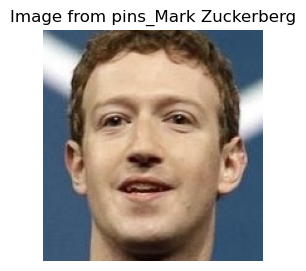

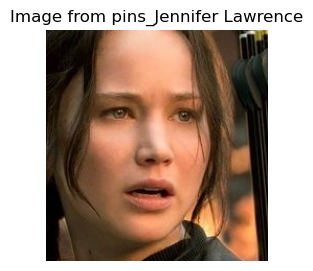

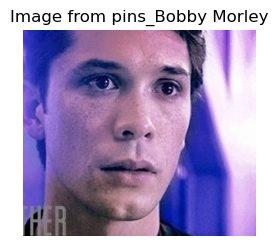

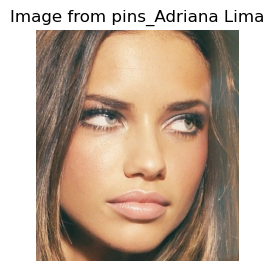

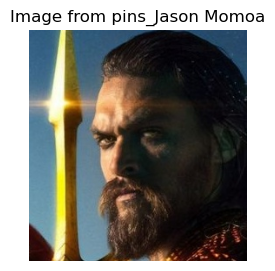

...

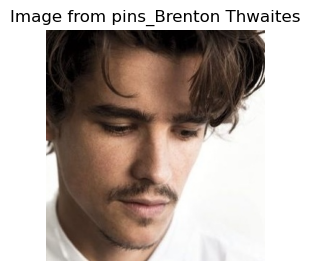

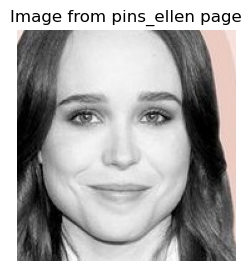

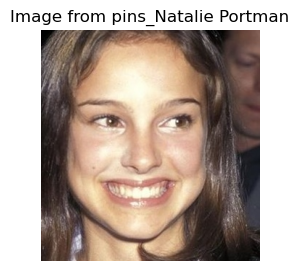

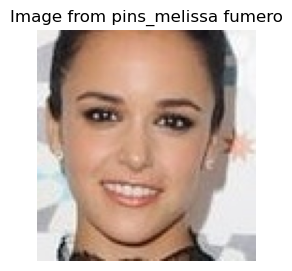

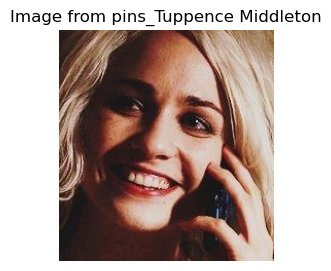

In [16]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to display one image from each dataset folder
def display_one_image_per_folder():
    # Specify the parent directory where the datasets are located
    parent_dir = "Images"

    # Get a list of subdirectories (dataset folders) with the naming convention "pins_{name}"
    dataset_folders = [folder for folder in os.listdir(parent_dir) if folder.startswith("pins_")]

    # Loop through each dataset folder and display one image from each
    for dataset_folder in dataset_folders:
        # Get the list of image files in the dataset directory
        dataset_path = os.path.join(parent_dir, dataset_folder)
        image_files = [os.path.join(dataset_path, img_name) for img_name in os.listdir(dataset_path)]

        if image_files:
            
            plt.figure(figsize=(3, 3))  # Adjust the size as needed

            # Display the first image in the folder
            img = cv2.imread(image_files[0])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Image from {dataset_folder}")
            plt.show()

# Call the function to display one image from each dataset folder
display_one_image_per_folder()

1/1 [==============================] - 0s 383ms/step


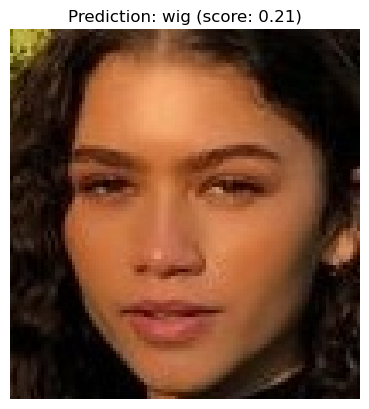

In [4]:
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
import matplotlib.pyplot as plt
import cv2
import os

# Load the pre-trained ResNet50 model
model = ResNet50(weights='imagenet')

# Specify the parent directory where the datasets are located
parent_dir = "Images"

# Get a list of subdirectories (dataset folders) with the naming convention "pins_{name}"
dataset_folders = [folder for folder in os.listdir(parent_dir) if folder.startswith("pins_")]

# Loop through each dataset folder
for dataset_folder in dataset_folders:
    dataset_path = os.path.join(parent_dir, dataset_folder)

    # Get the list of image files in the dataset directory
    image_files = [os.path.join(dataset_path, img_name) for img_name in os.listdir(dataset_path)]

    if image_files:
        # Process and display images from the folder
        for img_path in image_files:
            # Load and preprocess the image
            img = image.load_img(img_path, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)

            # Make predictions
            predictions = model.predict(x)

            # Decode the predictions
            decoded_predictions = decode_predictions(predictions, top=1)[0]  # top prediction
            imagenet_id, label, score = decoded_predictions[0]

            # Display the image with the predicted label
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display

            plt.imshow(img)
            plt.title(f'Prediction: {label} (score: {score:.2f})')
            plt.axis('off')  # Turn off axis numbers and ticks
            plt.show()


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model

# Load and preprocess your clean images (x_train and x_test)
# Ensure your data is loaded correctly, and dimensions match the model's input shape.

# Create a noisy dataset
noise_factor = 0.5
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)
x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

# Define the autoencoder architecture
input_img = Input(shape=(128, 128, 3))
x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

# Train the autoencoder
autoencoder.fit(x_train_noisy, x_train,
                epochs=10,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_noisy, x_test))

# Generate denoised images
denoised_images = autoencoder.predict(x_test_noisy)

# Visualization
n = 5  # number of images to display
plt.figure(figsize=(20, 4))
for i in range(n):
    plt.subplot(4, n, i + 1)
    plt.imshow(x_test[i])
    plt.title('Original')
    plt.axis('off')

    plt.subplot(4, n, i + 1 + n)
    plt.imshow(x_test_noisy[i])
    plt.title('Noisy')
    plt.axis('off')

    plt.subplot(4, n, i + 1 + 2 * n)
    plt.imshow(denoised_images[i])
    plt.title('Denoised')
    plt.axis('off')
plt.show()


Epoch 1/10
 73/110 [==================>...........] - ETA: 1:00 - loss: 0.5569

KeyboardInterrupt: 